In [2]:
import numpy as np
import skimage as sk
import skimage.io as skio
import cv2
import matplotlib.pyplot as plt
from scipy.signal import convolve2d
import math
import numpy as np
import matplotlib.pyplot as plt
import skimage.transform as sktr
import math
import numpy as np
import matplotlib.pyplot as plt
import skimage.transform as sktr
from skimage.color import rgb2gray
from skimage.exposure import rescale_intensity, equalize_hist, equalize_adapthist
from skimage.util import img_as_ubyte
from skimage.io import imread, imsave


In [5]:
def visualize_grey(img):
    plt.imshow(img, cmap="gray")
    plt.axis("off")
    plt.show()

In [6]:
def visualize_color(img):
     plt.imshow(np.clip(img, 0, 255).astype(np.uint8))
     plt.axis("off")
     plt.show()

In [7]:
def visualize_float(img):
    skio.imshow(img)
    plt.axis("off")
    skio.show()

In [8]:
def save_image_255(img, filename):
    file_path = f'images/{filename}.png'
    img = np.clip(img, 0, 255).astype(np.uint8)
    skio.imsave(file_path, np.clip(img, 0, 255).astype(np.uint8))

In [9]:
def save_image0(img, filename):
    file_path = f'images/{filename}.png'
    img = (np.clip(img, 0, 1)*255).astype(np.uint8)
    skio.imsave(file_path, img)

In [10]:
def save_grey(img, filename):
    file_path = f'images/{filename}.png'
    skio.imsave(file_path, ((img - img.min()) / (img.max() - img.min() + 1e-8) * 255).astype(np.uint8))

In [11]:
def save_gray_contrast(gray, path, method="percentile", p_low=2, p_high=98):
    g = np.squeeze(np.asarray(gray, dtype=np.float64))  # HxW

    if method == "percentile":         # robust global stretch
        lo, hi = np.nanpercentile(g, (p_low, p_high))
        g = rescale_intensity(g, in_range=(lo, hi), out_range=(0, 1))
    elif method == "minmax":           # simple global stretch
        g = rescale_intensity(g, in_range='image', out_range=(0, 1))
    elif method == "hist_eq":          # global histogram equalization
        g = equalize_hist(g)           # already in [0,1]
    elif method == "clahe":            # local contrast (great for low-contrast)
        g = equalize_adapthist(g, clip_limit=0.01)  # in [0,1]
    else:
        raise ValueError("Unknown method")

    imsave(path, img_as_ubyte(np.clip(g, 0, 1)))  # writes nice 8-bit PNG

## Part 1.1

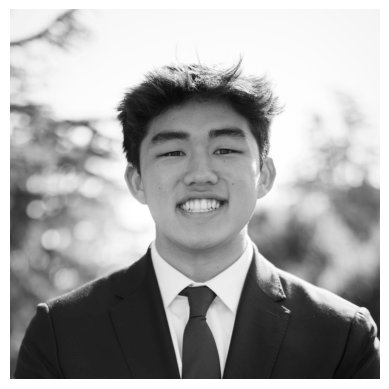

In [324]:
me_img = cv2.imread("pre_images/headshot.jpg", cv2.IMREAD_GRAYSCALE)
visualize_grey(me_img)
save_image_255(me_img, "original_headshot_gray")

In [303]:
def naive_convolve(img, kernel):
    """
    A naive implementation of 2D convolution. Only works for the box kernel 9 x 9 implementation
    """
    # zero pad to insure same size output; zero_padding = kernel_size // 2 + 1
    kernel_size = kernel.shape[0]
    pad = (kernel_size - 1) // 2
    padded = np.pad(img, ((pad, pad), (pad, pad)), mode='constant', constant_values=0.0)

    H, W = img.shape
    out = np.zeros((H, W), dtype=np.float64)

    for i in range(H):
        for j in range(W):
            total = 0.0
            # for every element in the kernel
            for m in range(kernel_size):
                for n in range(kernel_size):
                    total += padded[i+m, j+n] * kernel[m, n]
            out[i, j] = total
    return out

In [33]:
def convolve(img, kernel):
    """
    Given a kernel and an image, return the convolved image. This function assumes an odd shaped kernel
    """
    # zero pad to insure same size output; zero_padding = height // 2 + 1, width // 2 + 1
    img = np.asarray(img, dtype=np.float64) # cast to float
    kh, kw = kernel.shape

    pad_h = (kh - 1) // 2
    pad_w = (kw - 1) // 2

    padded = np.pad(img, ((pad_h, pad_h), (pad_w, pad_w)), mode='constant', constant_values=0.0)
    
    # flip kernel for convolution (convetion purposes)
    kernel = np.asarray(kernel, dtype=np.float64)
    kernel = kernel[::-1, ::-1]


    # convolve over (kh, kw) region of padded image
    H, W = img.shape
    out = np.empty_like(img, dtype=np.float64)

    for i in range(H):
        for j in range(W):
            window = padded[i:i+kh, j:j+kw] 
            out[i, j] = np.sum(window * kernel)
    return out
   

In [34]:
def create_kernel(kernel_size=9, kernel_type='box'):
    if kernel_type == 'box':
        kernel = np.ones((kernel_size, kernel_size), dtype=np.float64) / (kernel_size * kernel_size)
    elif kernel_type == 'dx':
        kernel = np.array([[-1, 0, 1]], dtype=np.float64) * 0.5
    elif kernel_type == 'dy':
        kernel = np.array([[-1], [0], [1]], dtype=np.float64) * 0.5
    else:
        raise ValueError("Unsupported kernel type")
    return kernel

Box Kernel 9 x 9 implementation

In [306]:
box_kernel = create_kernel(kernel_size=9, kernel_type='box')
me_img_smoothed = convolve(me_img, box_kernel)

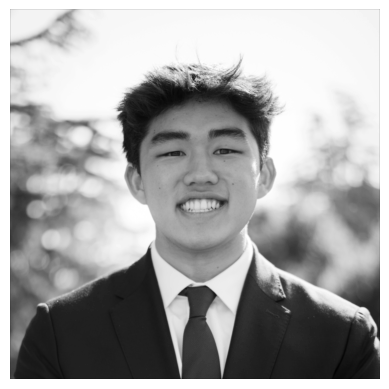

In [307]:
visualize_grey(me_img_smoothed)
save_image_255(me_img_smoothed, "headshot_smoothed")

Naive Box 9 x 9 Implementation (Cell has runtime of ~7 mins)

In [50]:
me_naive_smoothed = naive_convolve(me_img, box_kernel)

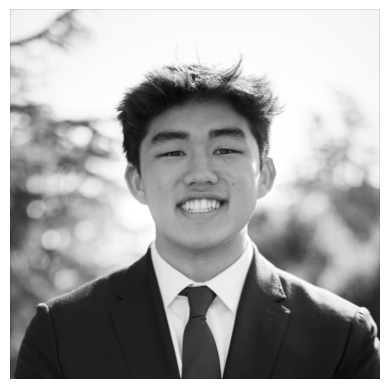

In [53]:
visualize_grey(me_naive_smoothed)

Finite Difference Operators

In [311]:
dx_kernel = create_kernel(kernel_size=3, kernel_type='dx')
dy_kernel = create_kernel(kernel_size=3, kernel_type='dy')
me_img_dx = convolve(me_img, dx_kernel)
me_img_dy = convolve(me_img, dy_kernel)

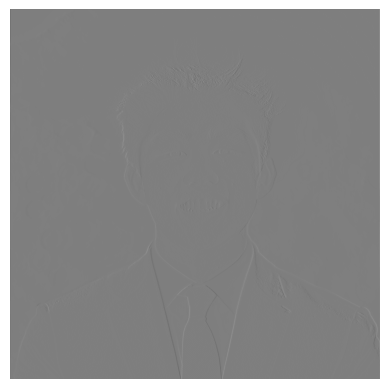

In [336]:
visualize_grey(me_img_dx)
save_grey(me_img_dx, "headshot_dx")

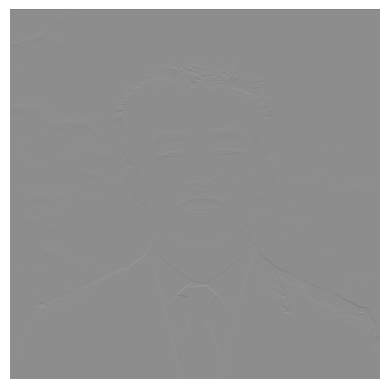

In [337]:
visualize_grey(me_img_dy)
save_grey(me_img_dy, "headshot_dy")

## Part 1.2

In [338]:
# compute gradient magnitude image
def gradient_magnitude(img_dx, img_dy):
    return np.sqrt(img_dx**2 + img_dy**2)

In [339]:
camerman = cv2.imread("pre_images/cameraman.png", cv2.IMREAD_GRAYSCALE)
save_image_255(camerman, "cameraman_original")

libpng warning: iCCP: profile 'icc': 0h: PCS illuminant is not D50


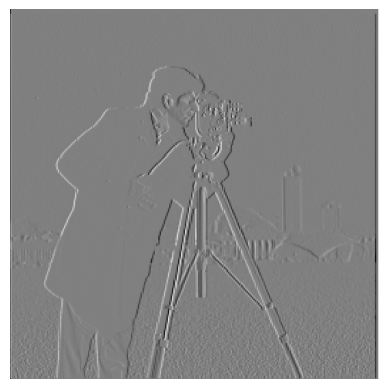

In [340]:
camerman_dx = convolve(camerman, dx_kernel)
visualize_grey(camerman_dx)
save_grey(camerman_dx, "cameraman_dx")

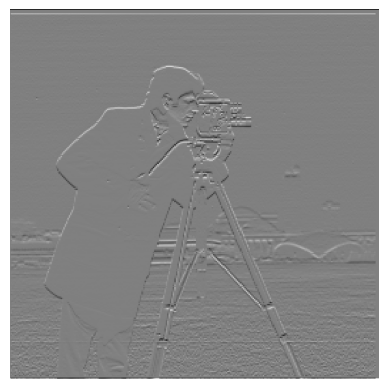

In [342]:
camerman_dy = convolve(camerman, dy_kernel)
visualize_grey(camerman_dy)
save_grey(camerman_dy, "cameraman_dy")

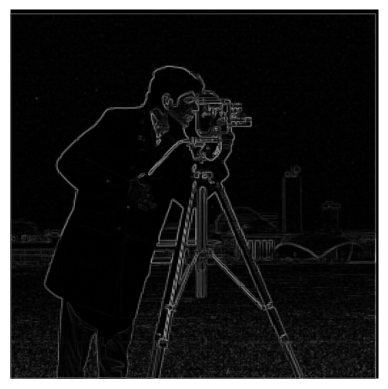

In [343]:
camerman_grad = gradient_magnitude(camerman_dx, camerman_dy)
visualize_grey(camerman_grad)
save_grey(camerman_grad, "cameraman_gradient_magnitude")

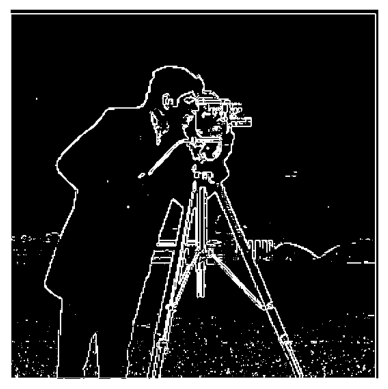

In [344]:
binarized = np.where(camerman_grad >= 25, 1.0, 0.0) # decrease threshold to get more thicker edges, however this increase noise
visualize_grey(binarized)
save_image0(binarized, "cameraman_binarized_edges")

## Part 1.3

2 step DoG

In [346]:
column = cv2.getGaussianKernel(ksize=9, sigma=1)
row = column.T
gaussian_kernel = np.dot(column, row)
gaussian_kernel.shape

(9, 9)

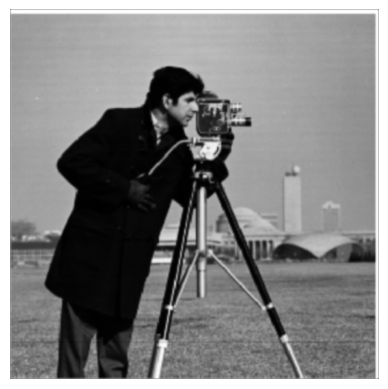

In [348]:
camerman_gaussian = convolve(camerman, gaussian_kernel)
visualize_grey(camerman_gaussian)
save_image_255(camerman_gaussian, "cameraman_gaussian")


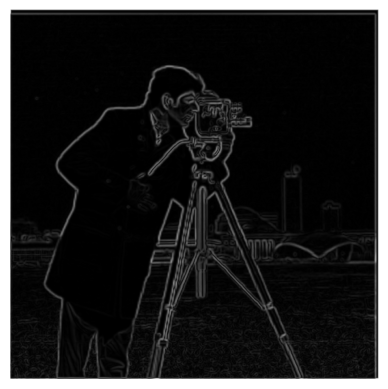

In [349]:
camerman_gaussian_dx = convolve(camerman_gaussian, dx_kernel)
camerman_gaussian_dy = convolve(camerman_gaussian, dy_kernel)
camerman_gaussian_grad = gradient_magnitude(camerman_gaussian_dx, camerman_gaussian_dy)
visualize_grey(camerman_gaussian_grad)
save_grey(camerman_gaussian_grad, "cameraman_gaussian_gradient")

Single step convolution, derivative of gaussian filter

In [35]:
def create_DoG(ksize: int = 9, sigma: float = 1.0):
    """
    Build 2D DoG filters:
      DoGx = g'(x) * g(y).T
      DoGy = g(x) * g'(y).T
    """
    gaussian_kernel = cv2.getGaussianKernel(ksize=ksize, sigma=sigma)
    m = ksize // 2
    x = np.arange(-m, m+1, dtype=np.float64).reshape(-1, 1) # locations where we want to evaluate the gaussian derivative
    dg = -(x / (sigma**2)) * gaussian_kernel 

    DoGx = dg @ gaussian_kernel.T 
    DoGy = gaussian_kernel  @ dg.T 
    return DoGx, DoGy

In [351]:
DoGx, DoGy = create_DoG(ksize=9, sigma=1.0)
DoGx.shape, DoGy.shape

((9, 9), (9, 9))

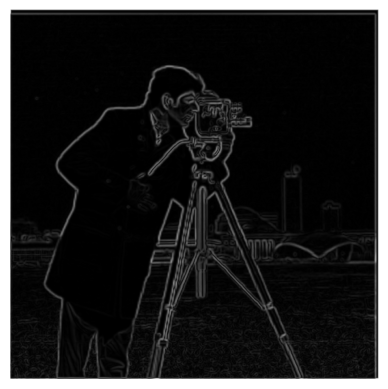

In [352]:
camerman_gaussian_dx = convolve(camerman_gaussian, dx_kernel)
save_grey(camerman_gaussian_dx, "DoGx_filter")
camerman_gaussian_dy = convolve(camerman_gaussian, dy_kernel)
save_grey(camerman_gaussian_dy, "DoGy_filter")
camerman_gaussian_grad = gradient_magnitude(camerman_gaussian_dx, camerman_gaussian_dy)
visualize_grey(camerman_gaussian_grad)
save_grey(camerman_gaussian_grad, "cameraman_DoG_gradient")


# Part 2: Fun with Frequencies!

## Part 2.1: Image "Sharpening"

In [ ]:
# convolve on gaussian filter to get blurred image
# subtract blurred image from original image to get high frequency components
# add high frequency components back to original image to get sharpened image

In [36]:
def sharpen_img(img, ksize=9, sigma=1.0, alpha=1.0):
    """
    convolve on gaussian filter to get blurred image
    subtract blurred image from original image to get high frequency components
    add high frequency components back to original image to get sharpened image
    """
    gaussian_kernel = cv2.getGaussianKernel(ksize=ksize, sigma=sigma)
    row = gaussian_kernel.T
    gaussian_2d = np.dot(gaussian_kernel, row)

    sharpened_img = np.zeros_like(img, dtype=np.uint8) # storage array for sharpened image
    blurred_img = np.zeros_like(img, dtype=np.uint8) 
    high_freq_img = np.zeros_like(img, dtype=np.uint8)
    # convolve each channel separately
    for channel in range(3):
        img_channel = img[..., channel]
        blurred = convolve(img_channel, gaussian_2d)
        high_freq = img_channel - blurred
        sharpened = img_channel + alpha * high_freq
        sharpened = np.clip(sharpened, 0, 255).astype(np.uint8)
        high_freq = np.clip(high_freq, 0, 255).astype(np.uint8)
        blurred = np.clip(blurred, 0, 255).astype(np.uint8)
        sharpened_img[..., channel] = sharpened
        high_freq_img[..., channel] = high_freq
        blurred_img[..., channel] = blurred
    return sharpened_img, blurred_img, high_freq_img

Original Image

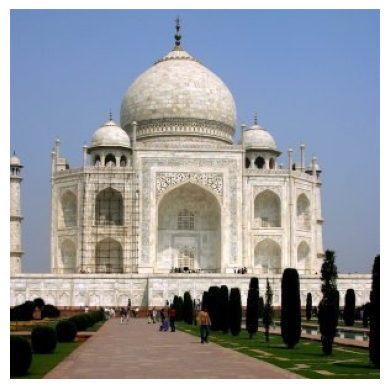

In [364]:
taj_img = cv2.imread("pre_images/taj.jpg")
taj_img= cv2.cvtColor(taj_img, cv2.COLOR_BGR2RGB)
visualize_color(taj_img)
save_image_255(taj_img, "taj_original")

Sharpened Image 

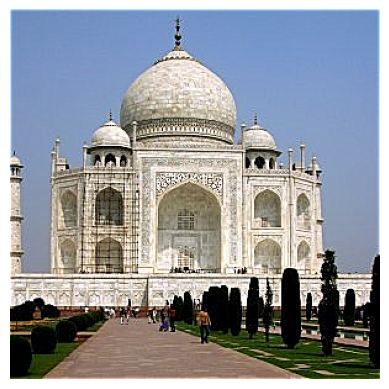

In [368]:
sharpen_taj, blurred_taj, high_freq_taj = sharpen_img(taj_img, ksize=9, sigma=1.0, alpha=1.75)
visualize_color(sharpen_taj)
save_image_255(sharpen_taj, "taj_sharpened")

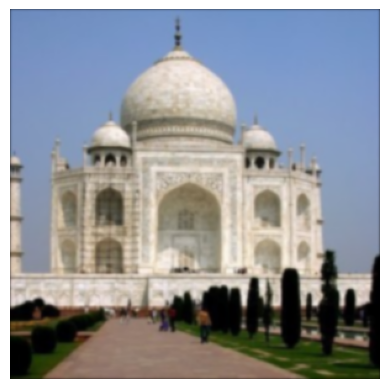

In [369]:
visualize_color(blurred_taj)
save_image_255(blurred_taj, "taj_blurred")

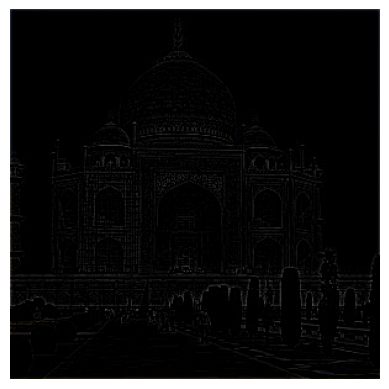

In [372]:
visualize_color(high_freq_taj)
save_image_255(high_freq_taj, "taj_high_freq")

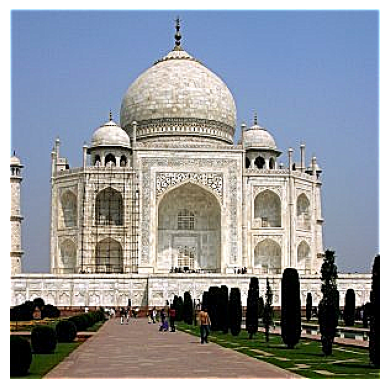

In [375]:
sharpen_taj_more = sharpen_img(taj_img, ksize=9, sigma=1.0, alpha=2.0)[0]
visualize_color(sharpen_taj_more)
save_image_255(sharpen_taj_more, "taj_sharpened_more")

Other Sharpening Examples

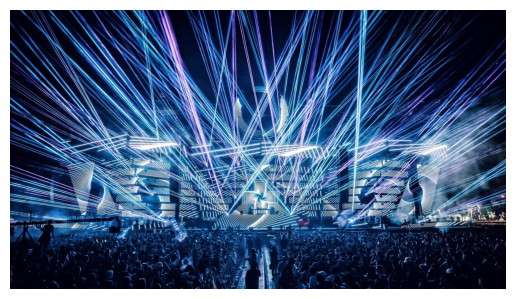

In [378]:
fesitval_img = cv2.imread("pre_images/festival.jpg")
fesitval_img= cv2.cvtColor(fesitval_img, cv2.COLOR_BGR2RGB)
visualize_color(fesitval_img)
save_image_255(fesitval_img, "festival_original")

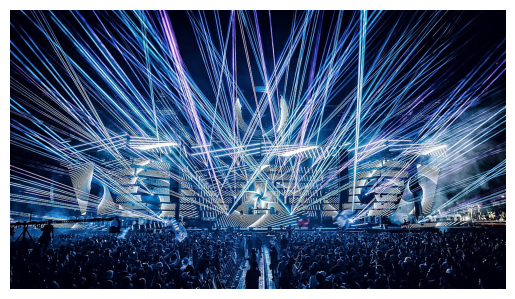

In [385]:
fesitval_img_sharpened = sharpen_img(fesitval_img, ksize=9, sigma=1.0, alpha=1.5)[0]
visualize_color(fesitval_img_sharpened)
save_image_255(fesitval_img_sharpened, "festival_sharpened")

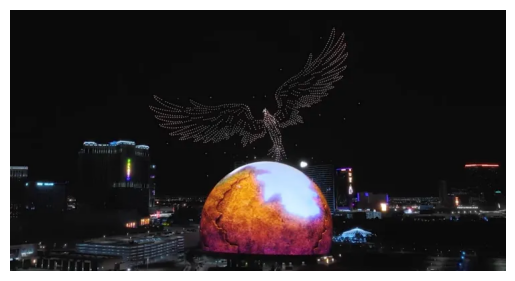

In [391]:
sphere_img = cv2.imread("pre_images/sphere.webp")
visualize_color(sphere_img)
save_image_255(sphere_img, "sphere_original")


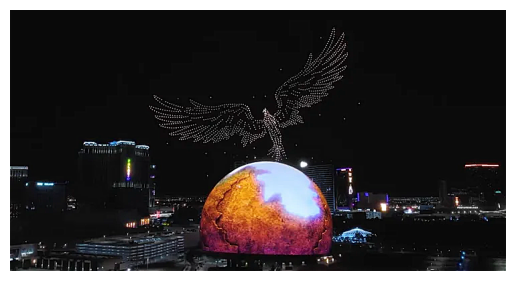

In [392]:
sphere_img_sharpened = sharpen_img(sphere_img, ksize=9, sigma=1.0, alpha=1.5)[0]
visualize_color(sphere_img_sharpened)
save_image_255(sphere_img_sharpened, "sphere_sharpened")

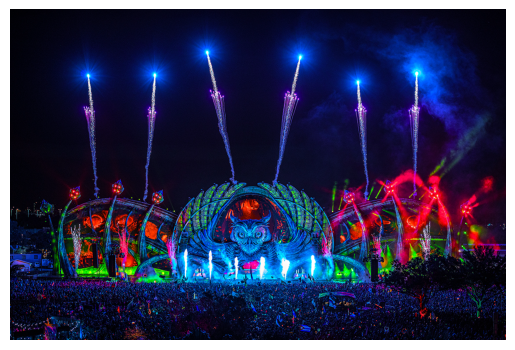

In [393]:
edc_img = cv2.imread("pre_images/edc.jpg")
visualize_color(edc_img)
save_image_255(edc_img, "edc_original")

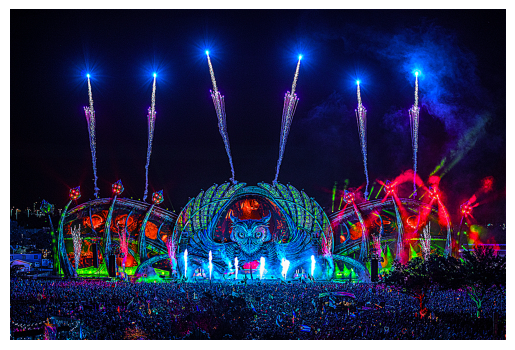

In [395]:
edc_img_sharpened = sharpen_img(edc_img, ksize=9, sigma=1.5, alpha=1.5)[0]
visualize_color(edc_img_sharpened)
save_image_255(edc_img_sharpened, "edc_sharpened")

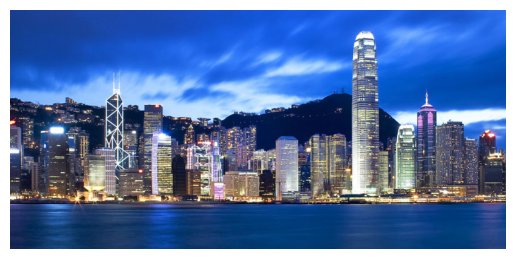

In [188]:
hongkong_img = cv2.imread("pre_images/hongkong.jpg")
visualize_color(hongkong_img)

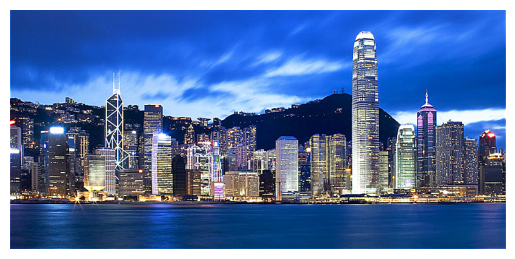

In [189]:
hongkong_img_sharpened = sharpen_img(hongkong_img, ksize=9, sigma=1.0, alpha=1.5)
visualize_color(hongkong_img_sharpened)

## Part 2.2: Hybrid Images

In [37]:
def get_points(im1, im2):
    print('Please select 2 points in each image for alignment.')
    plt.imshow(im1)
    p1, p2 = plt.ginput(2)
    plt.close()
    plt.imshow(im2)
    p3, p4 = plt.ginput(2)
    plt.close()
    return (p1, p2, p3, p4)

def recenter(im, r, c):
    R, C, _ = im.shape
    rpad = (int) (np.abs(2*r+1 - R))
    cpad = (int) (np.abs(2*c+1 - C))
    return np.pad(
        im, [(0 if r > (R-1)/2 else rpad, 0 if r < (R-1)/2 else rpad),
             (0 if c > (C-1)/2 else cpad, 0 if c < (C-1)/2 else cpad),
             (0, 0)], 'constant')

def find_centers(p1, p2):
    cx = np.round(np.mean([p1[0], p2[0]]))
    cy = np.round(np.mean([p1[1], p2[1]]))
    return cx, cy

def align_image_centers(im1, im2, pts):
    p1, p2, p3, p4 = pts
    h1, w1, b1 = im1.shape
    h2, w2, b2 = im2.shape
    
    cx1, cy1 = find_centers(p1, p2)
    cx2, cy2 = find_centers(p3, p4)

    im1 = recenter(im1, cy1, cx1)
    im2 = recenter(im2, cy2, cx2)
    return im1, im2

# def rescale_images(im1, im2, pts):
#     p1, p2, p3, p4 = pts
#     len1 = np.sqrt((p2[1] - p1[1])**2 + (p2[0] - p1[0])**2)
#     len2 = np.sqrt((p4[1] - p3[1])**2 + (p4[0] - p3[0])**2)
#     dscale = len2/len1
#     if dscale < 1:
#         im1 = sktr.rescale(im1, dscale)
#     else:
#         im2 = sktr.rescale(im2, 1./dscale)
#     return im1, im2

def rescale_images(im1, im2, pts):
    p1, p2, p3, p4 = pts
    len1 = np.hypot(p2[0]-p1[0], p2[1]-p1[1])
    len2 = np.hypot(p4[0]-p3[0], p4[1]-p3[1])
    dscale = len2 / len1

    if dscale < 1.0:
        im1 = cv2.resize(im1, dsize=None, fx=dscale, fy=dscale, interpolation=cv2.INTER_AREA)
    else:
        im2 = cv2.resize(im2, dsize=None, fx=1.0/dscale, fy=1.0/dscale, interpolation=cv2.INTER_AREA)

    # Keep dtype consistent
    return im1.astype(np.float64), im2.astype(np.float64)
def rotate_im1(im1, im2, pts):
    p1, p2, p3, p4 = pts
    theta1 = math.atan2(-(p2[1] - p1[1]), (p2[0] - p1[0]))
    theta2 = math.atan2(-(p4[1] - p3[1]), (p4[0] - p3[0]))
    dtheta = theta2 - theta1
    im1 = sktr.rotate(im1, dtheta*180/np.pi)
    return im1, dtheta

def match_img_size(im1, im2):
    # Make images the same size
    h1, w1, c1 = im1.shape
    h2, w2, c2 = im2.shape
    print(c1, c2)
    if h1 < h2:
        im2 = im2[int(np.floor((h2-h1)/2.)) : -int(np.ceil((h2-h1)/2.)), :, :]
    elif h1 > h2:
        im1 = im1[int(np.floor((h1-h2)/2.)) : -int(np.ceil((h1-h2)/2.)), :, :]
    if w1 < w2:
        im2 = im2[:, int(np.floor((w2-w1)/2.)) : -int(np.ceil((w2-w1)/2.)), :]
    elif w1 > w2:
        im1 = im1[:, int(np.floor((w1-w2)/2.)) : -int(np.ceil((w1-w2)/2.)), :]
    print(im1.shape, im2.shape)
    assert im1.shape == im2.shape
    return im1, im2

def align_images(im1, im2):
    pts = get_points(im1, im2)
    im1, im2 = align_image_centers(im1, im2, pts)
    im1, im2 = rescale_images(im1, im2, pts)
    im1, angle = rotate_im1(im1, im2, pts)
    im1, im2 = match_img_size(im1, im2)
    return im1, im2


# if __name__ == "__main__":
#     # 1. load the image
#     # 2. align the two images by calling align_images
#     # Now you are ready to write your own code for creating hybrid images!
#     pass

Loading in Derek/Nutmeg

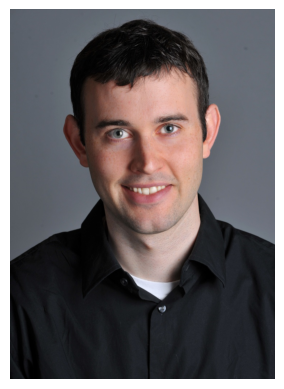

In [396]:
derek = skio.imread("pre_images/DerekPicture.jpg")
visualize_color(derek)
save_image_255(derek, "derek_original")

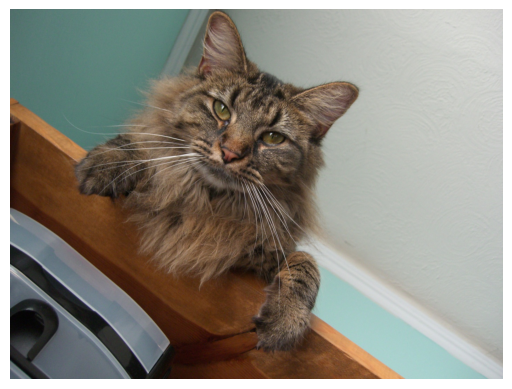

In [397]:
nutmeg = skio.imread("pre_images/nutmeg.jpg")
visualize_color(nutmeg)
save_image_255(nutmeg, "nutmeg_original")

Alligning Images

In [123]:
%matplotlib qt
nutmeg_alligned, derek_alligned, = align_images(nutmeg, derek)

Please select 2 points in each image for alignment.


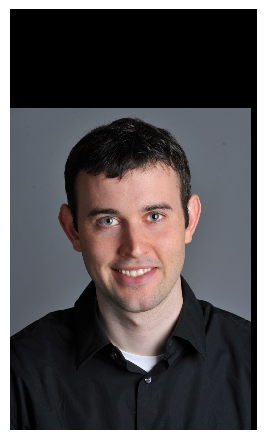

In [400]:
%matplotlib inline
visualize_float(derek_alligned)
save_image_255(derek_alligned, "derek_aligned")

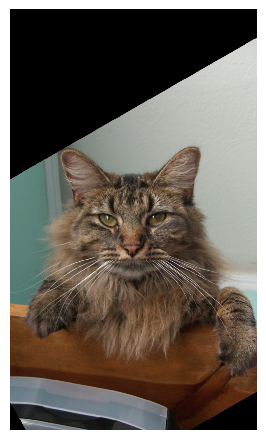

In [401]:
visualize_float(nutmeg_alligned)
save_image0(nutmeg_alligned, "nutmeg_aligned")

low pass filter for Derek (smoothing by Gaussian)

In [38]:
# smooth derek by running gaussina filter on each channel of derek image
def smooth_img_color(img, ksize=9, sigma=1.5):
    smoothed_img = np.zeros_like(img, dtype=np.float64)
    for channel in range(3):
        img_channel = img[..., channel]
        gaussian_kernel = cv2.getGaussianKernel(ksize=ksize, sigma=sigma)
        row = gaussian_kernel.T
        gaussian_2d = np.dot(gaussian_kernel, row)
        smoothed = convolve(img_channel, gaussian_2d)
        smoothed_img[..., channel] = smoothed
    return smoothed_img

In [419]:
derek_alligned_smoothed = smooth_img_color(derek_alligned, sigma = 2.0)

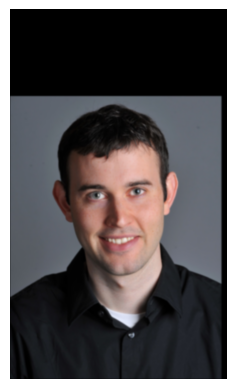

In [420]:
visualize_color(derek_alligned_smoothed)
save_image_255(derek_alligned_smoothed, "derek_low_pass")

High pass filter for nutmeg

In [39]:
def high_pass_filter(img, kernel_size=9, sigma=1.0):
    """
    convolve on gaussian filter to get blurred image
    subtract blurred image from original image to get high frequency components
    """
    gaussian_kernel = cv2.getGaussianKernel(ksize=kernel_size, sigma=sigma)
    row = gaussian_kernel.T
    gaussian_2d = np.dot(gaussian_kernel, row)

    high_freq_img = np.zeros_like(img, dtype=np.float64) # storage array for high freqs
    # convolve each channel separately
    for channel in range(3):
        img_channel = img[..., channel]
        blurred = convolve(img_channel, gaussian_2d)
        high_freq = img_channel - blurred
        high_freq_img[..., channel] = high_freq
    return high_freq_img

In [514]:
nutmeg_high_freq = high_pass_filter(nutmeg_alligned, kernel_size=23, sigma=2.5)

In [66]:
def visualize_signed(img):
    hp_min, hp_max = img.min(), img.max()
    edge_img = (img - hp_min) / (hp_max - hp_min) * 255
    edge_img = edge_img.astype(np.uint8)
    visualize_color(edge_img)

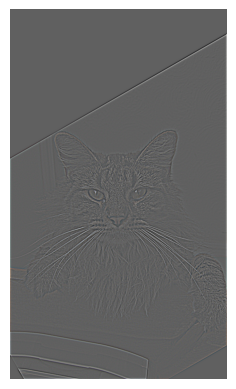

In [515]:
hp_min, hp_max = nutmeg_high_freq.min(), nutmeg_high_freq.max()
edge_img = (nutmeg_high_freq - hp_min) / (hp_max - hp_min) * 255
nutmeg_edge = edge_img.astype(np.uint8)
visualize_color(nutmeg_edge)

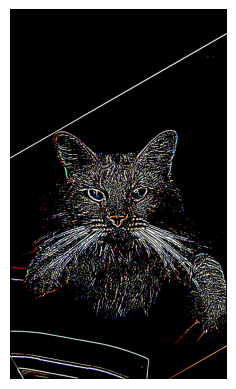

In [499]:
nutmeg_edge_bin = np.where(nutmeg_edge >= 89, 0.0, 1.0)
visualize_grey(nutmeg_edge_bin)

Hybrid Image

In [522]:
hybrid_image = np.clip(derek_alligned_smoothed + nutmeg_edge, 0.0, 255.0) # default to 0.0 and 1.0 if over limits

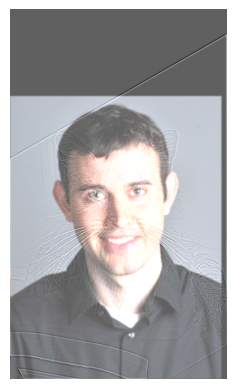

In [523]:
visualize_color(hybrid_image)

In [408]:
save_image0(hybrid_image, "derek_nutmeg_hybrid_image")

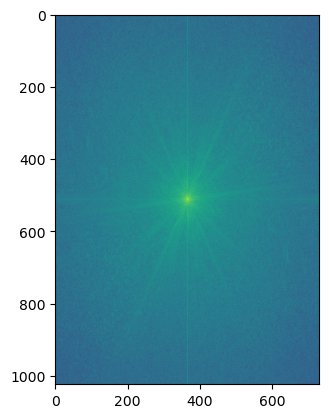

In [528]:
plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(rgb2gray(derek))))))

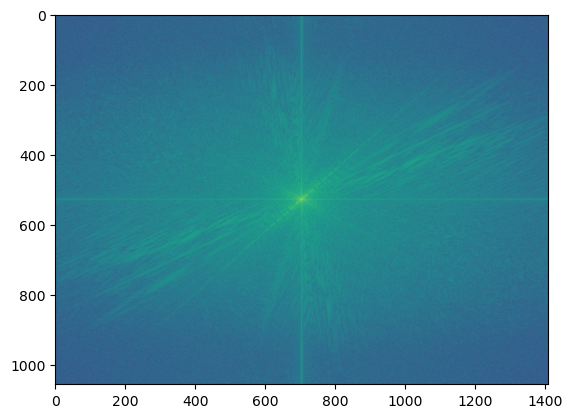

In [529]:
plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(rgb2gray(nutmeg))))))

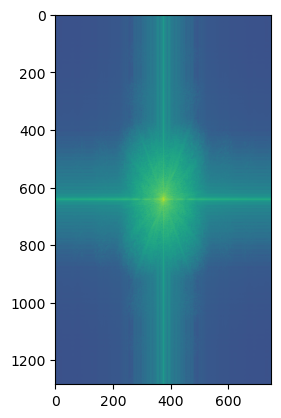

In [409]:
plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(rgb2gray(derek_alligned_smoothed))))))

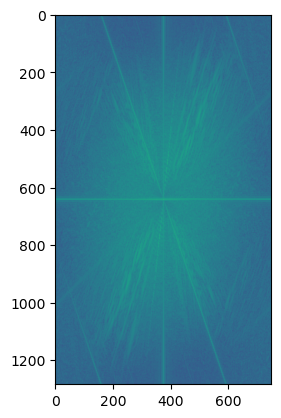

In [410]:
plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(rgb2gray(nutmeg_high_freq))))))

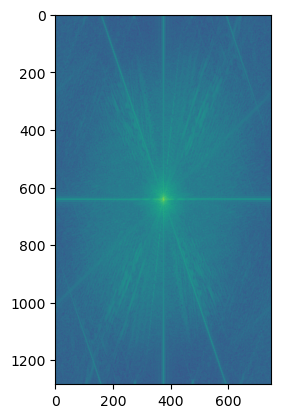

In [511]:
plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(rgb2gray(hybrid_image))))))

Other Hybrid Examples

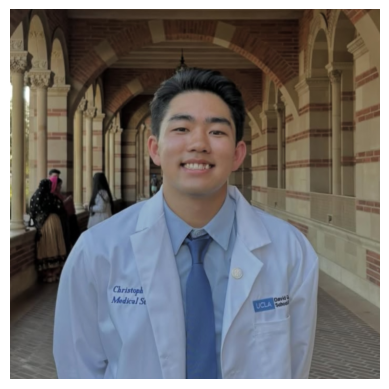

In [524]:
chris_img = skio.imread("pre_images/Chris_square.jpg") 
visualize_color(chris_img)

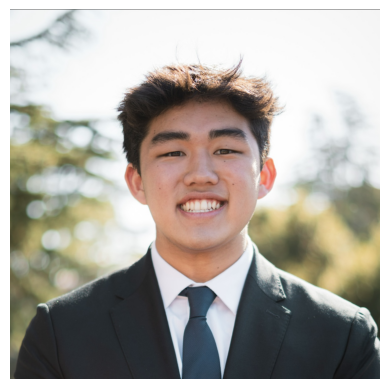

In [525]:
ryan_img = skio.imread("pre_images/Ryan_square.jpg")
visualize_color(ryan_img)

In [230]:
%matplotlib qt
chris_allign, ryan_allign = align_images(chris_img, ryan_img)

Please select 2 points in each image for alignment.
3 3
(1010, 857, 3) (1010, 857, 3)


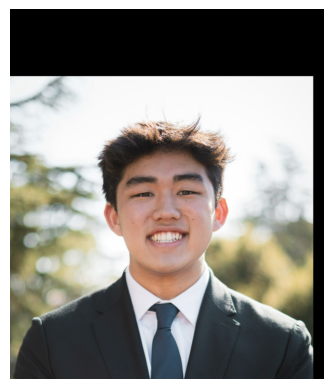

In [231]:
%matplotlib inline
visualize_color(ryan_allign)

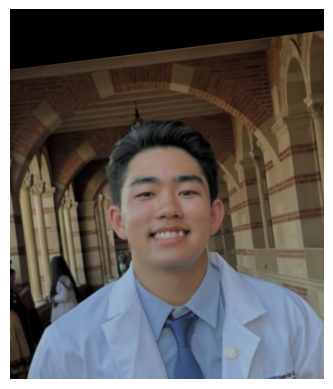

In [232]:
visualize_color(chris_allign)

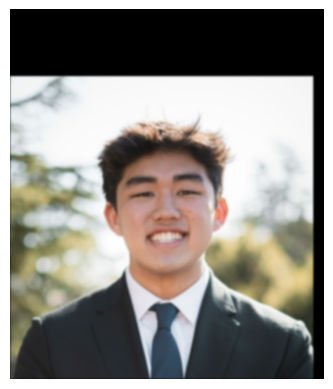

In [246]:
ryan_smoothed = smooth_img_color(ryan_allign, ksize = 13, sigma=2.5)
visualize_color(ryan_smoothed)

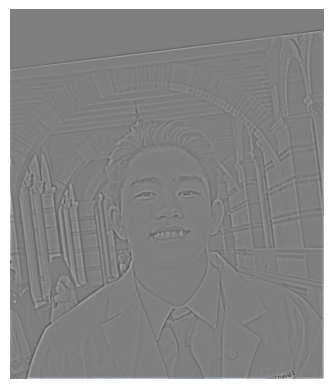

In [247]:
chris_high_freq = high_pass_filter(chris_allign, kernel_size=19, sigma=3.0)
visualize_signed(chris_high_freq)

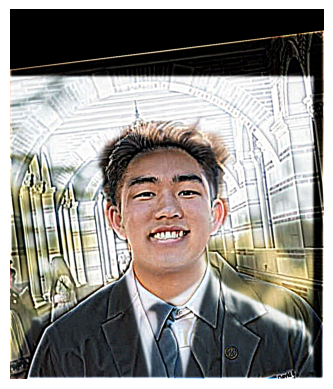

In [540]:
hybrid_image_cr = np.clip(ryan_smoothed + chris_high_freq * 10, 0.0, 255.0) # default to 0.0 and 1.0 if over limits
visualize_color(hybrid_image_cr)

forier analysis

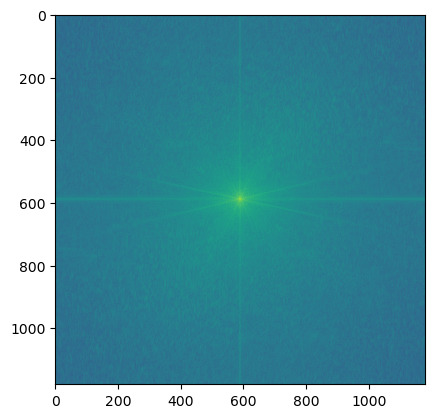

In [278]:
plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(rgb2gray(ryan_img))))))

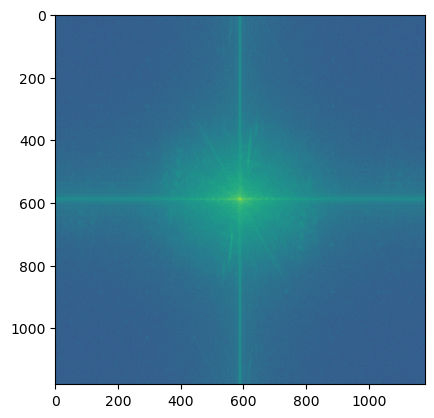

In [279]:
plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(rgb2gray(chris_img))))))

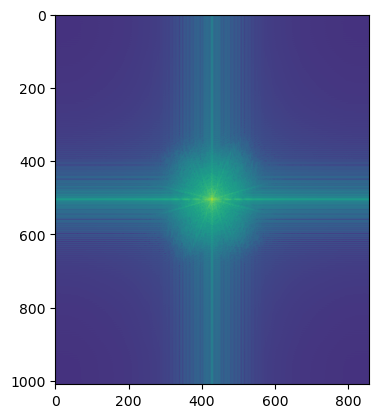

In [280]:
plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(rgb2gray(ryan_smoothed))))))

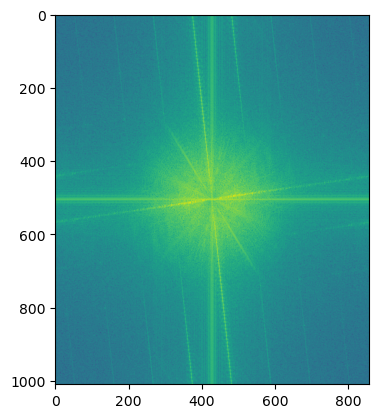

In [281]:
plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(rgb2gray(chris_high_freq))))))

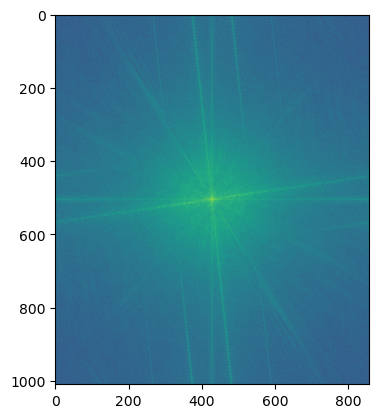

In [541]:
plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(rgb2gray(hybrid_image_cr))))))

Corgi blending

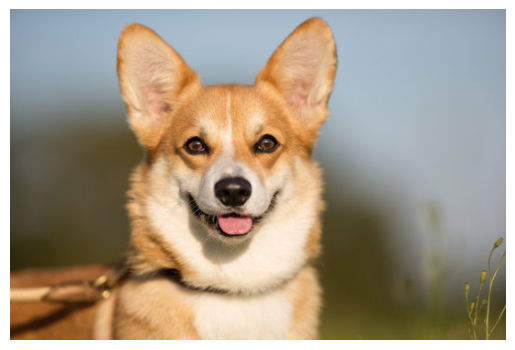

In [253]:
corgi_img = skio.imread("pre_images/corgi.jpg")
visualize_color(corgi_img)

In [257]:
%matplotlib qt
corgi_allign, chris_allign = align_images(corgi_img, chris_img)

Please select 2 points in each image for alignment.
3 3
(423, 593, 3) (423, 593, 3)


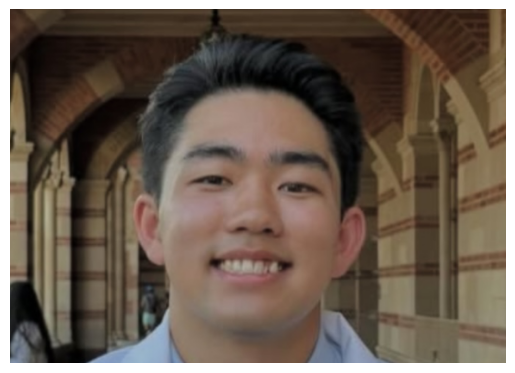

In [260]:
%matplotlib inline
visualize_color(chris_allign)

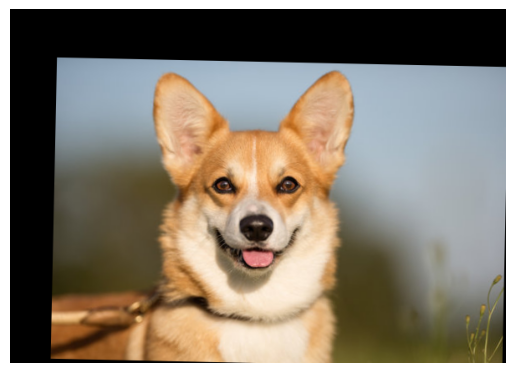

In [261]:
visualize_color(corgi_allign)

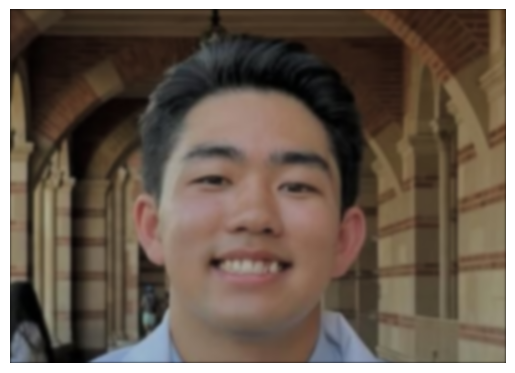

In [272]:
chris_smoothed = smooth_img_color(chris_allign, ksize = 13, sigma=1.5)
visualize_color(chris_smoothed)

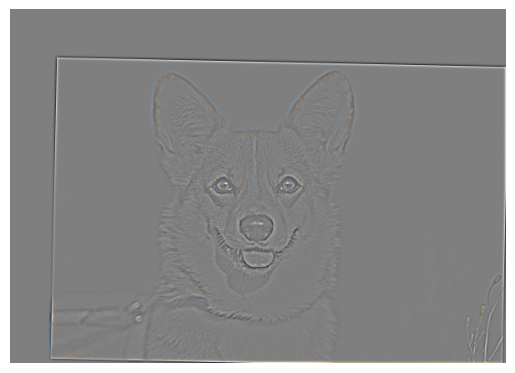

In [273]:
corgi_high_freq = high_pass_filter(corgi_allign, kernel_size=19, sigma=1.5)
visualize_signed(corgi_high_freq)

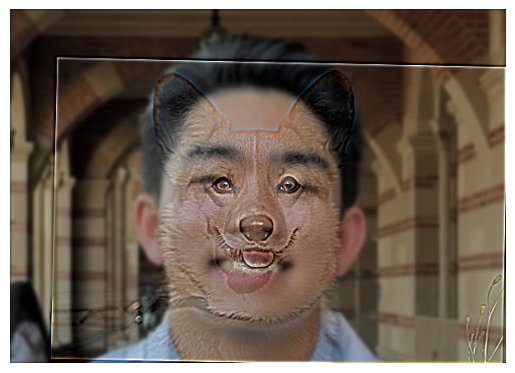

In [545]:
hybrid_image_cr = np.clip(chris_smoothed + corgi_high_freq *3, 0.0, 255.0) # default to 0.0 and 1.0 if over limits
visualize_color(hybrid_image_cr)

## Part 2.3 Gaussian and Laplacian Stacks

Apple Gaussian and Laplacian Stacks

In [40]:
def gaussian_stack(img, length=5, initial_sigma=1.0):
    """
    Create a Gaussian stack of images
    """
    gaussian_stack = []
    for i in range(length):
        sigma = initial_sigma * (1.5 ** i)
        smoothed = smooth_img_color(img, ksize=9, sigma=sigma)
        gaussian_stack.append(smoothed)
        img = smoothed
    return gaussian_stack
def laplacian_stack(gaussian_stack):
    """
    Create a Laplacian stack of images from a Gaussian stack
    """
    laplacian_stack = []
    for i in range(len(gaussian_stack)-1):
        laplacian = gaussian_stack[i] - gaussian_stack[i+1]
        laplacian_stack.append(laplacian)
    laplacian_stack.append(gaussian_stack[-1]) # last level is the same as the last Gaussian level
    return laplacian_stack

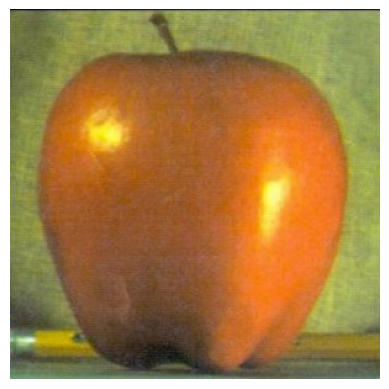

In [654]:
apple = skio.imread("pre_images/apple.jpeg")
visualize_color(apple)

In [655]:
gaussian_stack_apple = gaussian_stack(apple, length=5, initial_sigma=2.0)

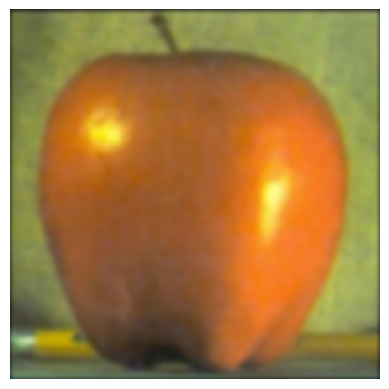

In [656]:
visualize_color(gaussian_stack_apple[0])

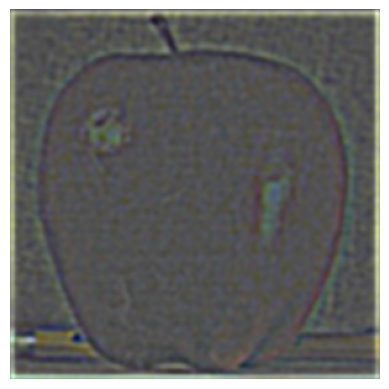

In [657]:
laplacian_stack_apple = laplacian_stack(gaussian_stack_apple)
visualize_signed(laplacian_stack_apple[0])

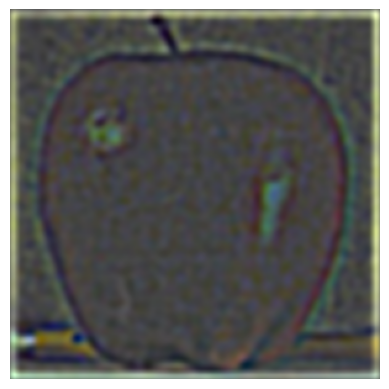

In [658]:
visualize_signed(laplacian_stack_apple[1])

In [41]:
def display_stacks_combined(gaussian_stack, laplacian_stack, title="Gaussian and Laplacian Stacks"):
    """
    Display Gaussian and Laplacian stacks side by side in a single figure
    """
    n_levels = len(gaussian_stack)
    fig, axes = plt.subplots(2, n_levels, figsize=(20, 8))
    
    # Display Gaussian stack on top row
    for i in range(n_levels):
        axes[0, i].imshow(np.clip(gaussian_stack[i], 0, 255).astype(np.uint8))
        axes[0, i].set_title(f'Gaussian Level {i}')
        axes[0, i].axis('off')
    
    # Display Laplacian stack on bottom row
    for i in range(n_levels):
        if i == n_levels - 1:  # Last level is just the Gaussian
            axes[1, i].imshow(np.clip(laplacian_stack[i], 0, 255).astype(np.uint8))
            axes[1, i].set_title(f'Residual Level {i} (Same as Gaussian)')
        else:
            lap = laplacian_stack[i]
            lap_min, lap_max = lap.min(), lap.max()
            lap_normalized = (lap - lap_min) / (lap_max - lap_min) * 255
            axes[1, i].imshow(lap_normalized.astype(np.uint8))
            axes[1, i].set_title(f'Laplacian Level {i}')
        axes[1, i].axis('off')
    
    plt.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()
    return fig

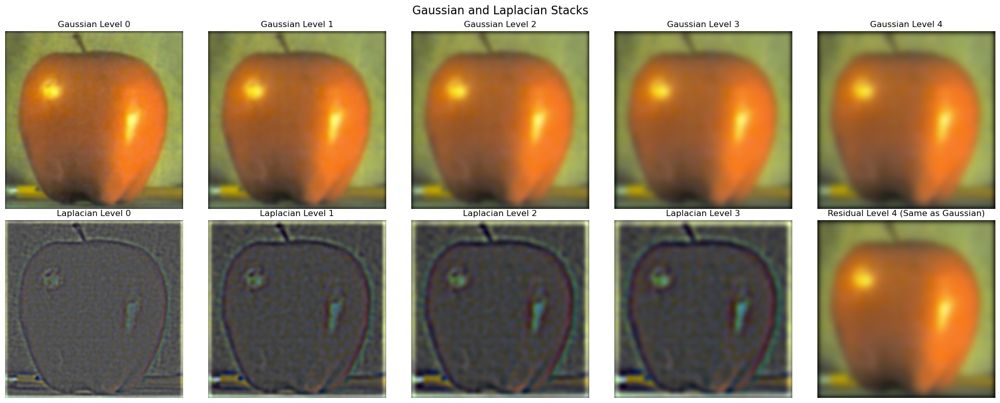

In [660]:
# Create and display combined apple stacks
fig = display_stacks_combined(gaussian_stack_apple, laplacian_stack_apple)

Orange Gaussian and Laplacian Stacks

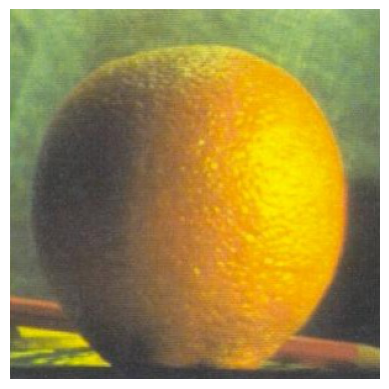

In [661]:
orange = skio.imread("pre_images/orange.jpeg")
visualize_color(orange)

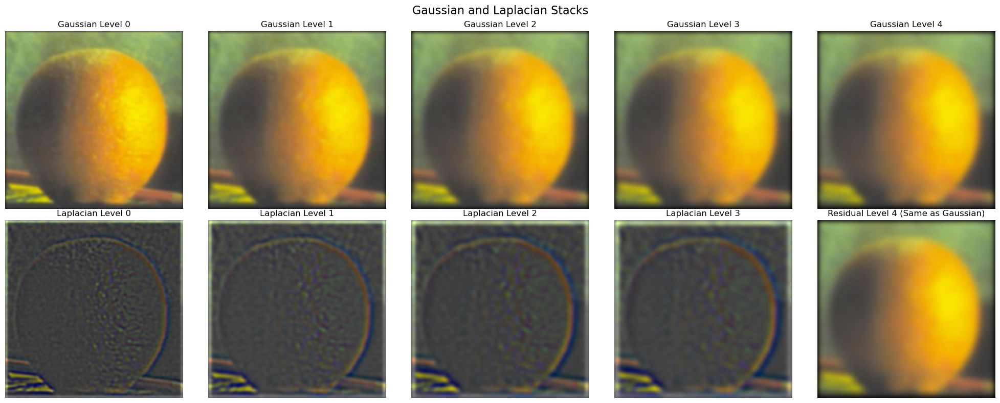

In [662]:
orange_gaussian_stack = gaussian_stack(orange, length=5, initial_sigma=2.0)
orange_laplacian_stack = laplacian_stack(orange_gaussian_stack)
fig = display_stacks_combined(orange_gaussian_stack, orange_laplacian_stack)

## Part 2.4 Multiresolution Blending

In [42]:
def create_mask(img, levels=5, sigma=2):
    """
    Create Binary Mask to Blend images together at different levels
    """
    H, W, C = img.shape

    #start with 1.0 on left half, 0.0 on right half
    mask = np.zeros((H, W), dtype=np.float32)
    mask[:, :W//2] = 1.0

    # Build Gaussian stack, increasing blur with each level
    stack = [mask]
    for i in range(1, levels):
        blurred = cv2.GaussianBlur(mask, (0, 0), sigmaX=sigma*(i))
        stack.append(blurred.astype(np.float32))

    # expand to 3 channels for color
    stack = [np.dstack([s, s, s]) for s in stack]

    return stack

def reconstruct(stack):
    img = np.zeros_like(stack[0])
    for l in stack:
        img += l
    return np.clip(img, 0, 255).astype(np.uint8)

def multires_blend(LA, LB, levels=5, sigma=2):
    mask = create_mask(LA[0], levels, sigma)

    # Blend at each Lapalacian level
    LS = []
    apple = []
    orange = []
    for i in range(levels):
        apple_contribution = mask[i] * LA[i]
        apple.append(apple_contribution)
        orange_contribution = (1 - mask[i]) * LB[i]
        orange.append(orange_contribution)
        blended = apple_contribution + orange_contribution
        LS.append(blended)

    # add up all levels to reconstruct
    return reconstruct(LS), LS, apple, orange

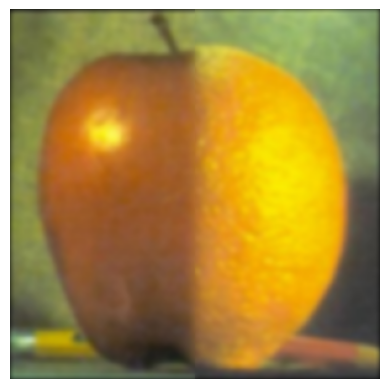

In [664]:
blended, LS, apple_contr, orange_contr = multires_blend(laplacian_stack_apple, orange_laplacian_stack, sigma=1.5)
visualize_color(blended)

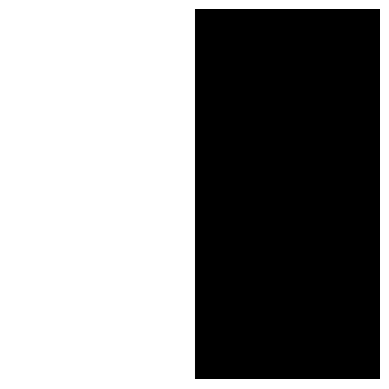

In [675]:
basic_mask = create_mask(apple, levels=5, sigma=2)
visualize_grey(basic_mask[0])


Recreating Figure 3.42

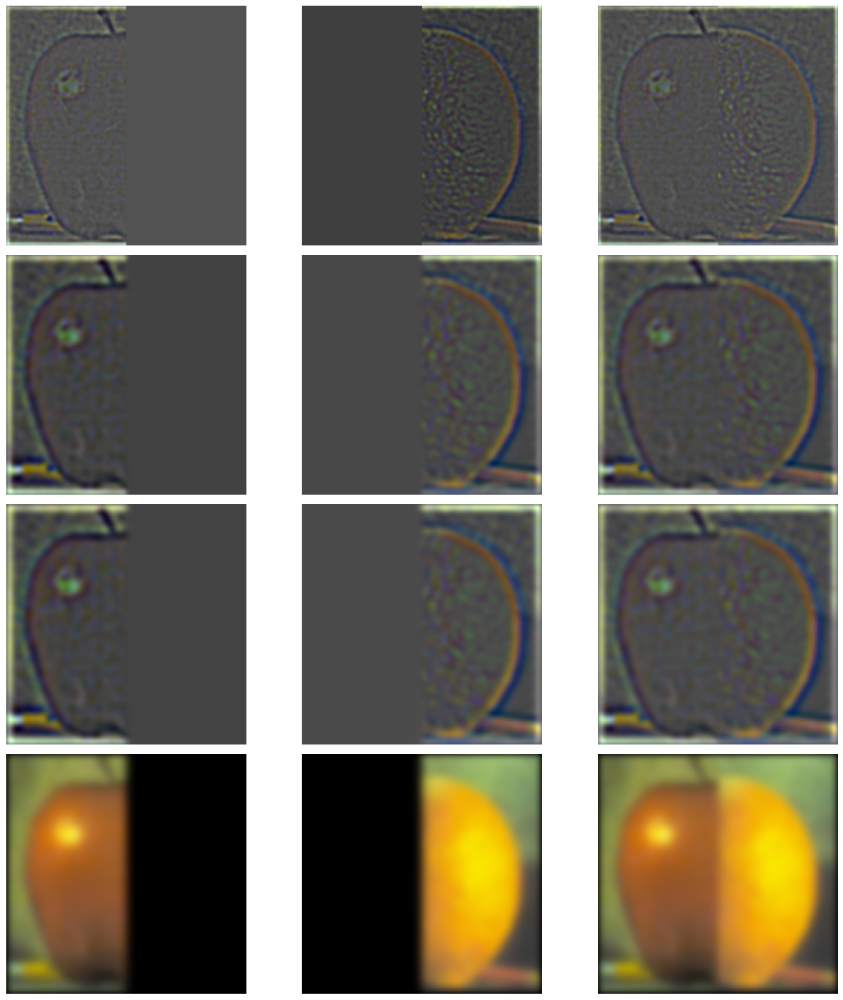

In [665]:
# Very similar to Part 2.3, just duplicated the code to show all images side by side
selected_levels = [0, 2, 3, 4]
n_levels = len(selected_levels)

fig, axes = plt.subplots(n_levels, 3, figsize=(15, 16))

for idx, level in enumerate(selected_levels):
    # Column 1: Apple contributions
    if level == 4: 
        axes[idx, 0].imshow(np.clip(apple_contr[level], 0, 255).astype(np.uint8))
    else:  # Laplacian levels
        apple_img = apple_contr[level]
        apple_min, apple_max = apple_img.min(), apple_img.max()
        if apple_max > apple_min: 
            apple_normalized = (apple_img - apple_min) / (apple_max - apple_min) * 255
        else:
            apple_normalized = np.zeros_like(apple_img)
        axes[idx, 0].imshow(apple_normalized.astype(np.uint8))
    axes[idx, 0].axis('off')

    # Column 2: Orange contributions  
    if level == 4:
        axes[idx, 1].imshow(np.clip(orange_contr[level], 0, 255).astype(np.uint8))
    else: 
        orange_img = orange_contr[level]
        orange_min, orange_max = orange_img.min(), orange_img.max()
        if orange_max > orange_min: 
            orange_normalized = (orange_img - orange_min) / (orange_max - orange_min) * 255
        else:
            orange_normalized = np.zeros_like(orange_img)
        axes[idx, 1].imshow(orange_normalized.astype(np.uint8))
    axes[idx, 1].axis('off')

    # Column 3: Blended results (LS)
    if level == 4:
        axes[idx, 2].imshow(np.clip(LS[level], 0, 255).astype(np.uint8))
    else:
        ls_img = LS[level]
        ls_min, ls_max = ls_img.min(), ls_img.max()
        if ls_max > ls_min:
            ls_normalized = (ls_img - ls_min) / (ls_max - ls_min) * 255
        else:
            ls_normalized = np.zeros_like(ls_img)
        axes[idx, 2].imshow(ls_normalized.astype(np.uint8))
    axes[idx, 2].axis('off')
plt.tight_layout()
plt.show()

other examples

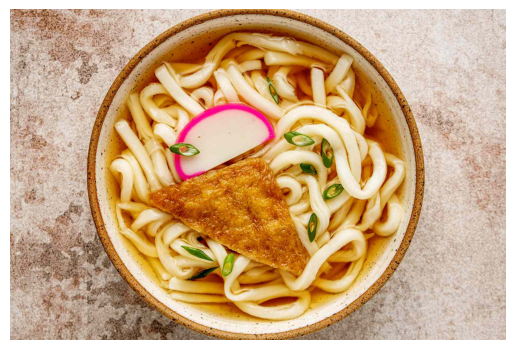

In [619]:
udon = skio.imread("pre_images/udon.jpg")
visualize_color(udon)

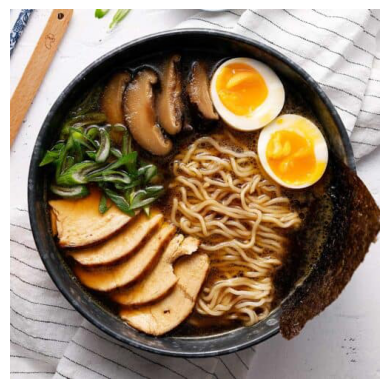

In [620]:
ramen = skio.imread("pre_images/ramen.jpg")
visualize_color(ramen)

In [625]:
%matplotlib qt
ramen, udon = align_images(ramen, udon)

Please select 2 points in each image for alignment.
3 3
(446, 505, 3) (446, 505, 3)
3 3
(446, 505, 3) (446, 505, 3)


In [626]:
%matplotlib inline
gaussian_stack_udon = gaussian_stack(udon, length=5, initial_sigma=2.0)
laplacian_stack_udon = laplacian_stack(gaussian_stack_udon)
gaussian_stack_ramen = gaussian_stack(ramen, length=5, initial_sigma=2.0)
laplacian_stack_ramen = laplacian_stack(gaussian_stack_ramen)

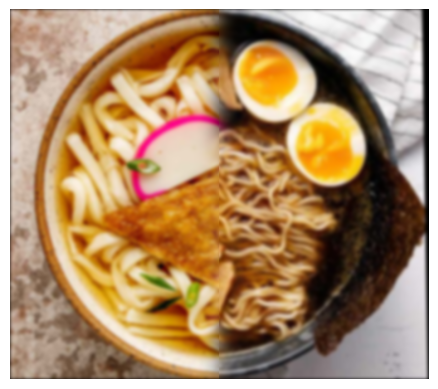

In [642]:
noodles, _, _, _ = multires_blend(laplacian_stack_udon, laplacian_stack_ramen, sigma=3)
visualize_color(noodles)

Complex Mask Example

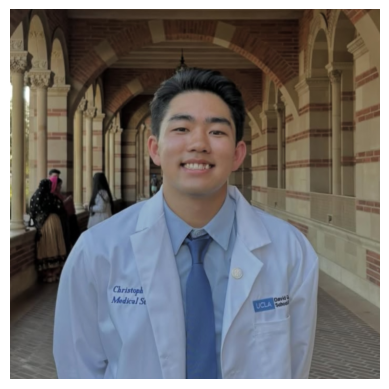

In [25]:
chris = skio.imread("pre_images/Chris_square.jpg")
visualize_color(chris)

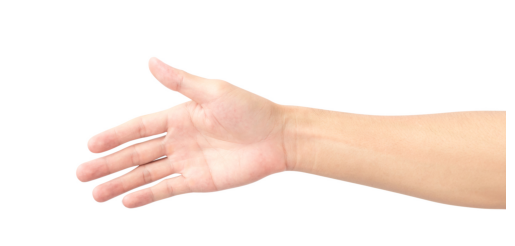

In [26]:
hand = skio.imread("pre_images/hand.jpg")
visualize_color(hand)

In [81]:
%matplotlib qt
hand_alligned, chris_alligned = align_images(hand, chris)

Please select 2 points in each image for alignment.
3 3
(671, 525, 3) (671, 525, 3)


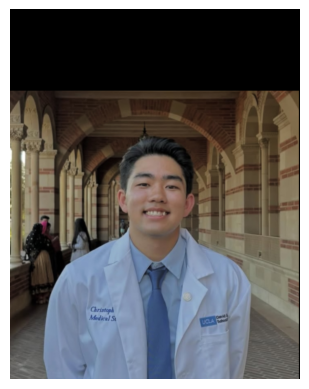

In [82]:
%matplotlib inline
visualize_color(chris_alligned)

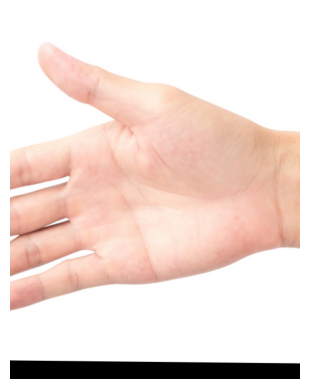

In [83]:
visualize_color(hand_alligned)

In [84]:
hand_gaussian_stack = gaussian_stack(hand_alligned, length=5, initial_sigma=2.0)
hand_laplacian_stack = laplacian_stack(hand_gaussian_stack)
chris_gaussian_stack = gaussian_stack(chris_alligned, length=5, initial_sigma=2.0)
chris_laplacian_stack = laplacian_stack(chris_gaussian_stack)

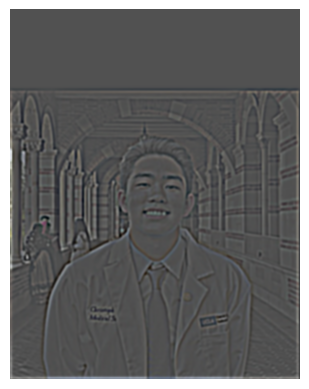

In [85]:
visualize_signed(chris_laplacian_stack[0])

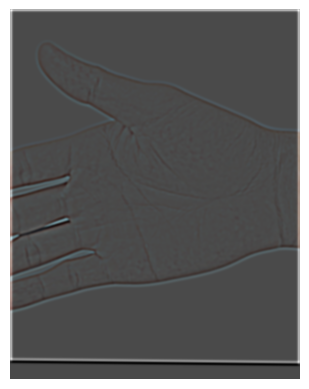

In [86]:
visualize_signed(hand_laplacian_stack[0])

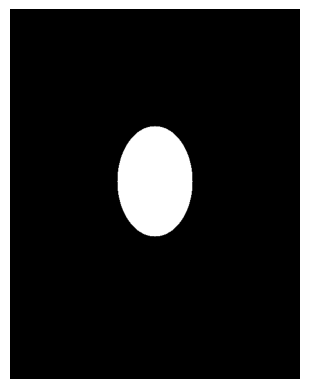

In [124]:
def create_head_mask_stack(img, center_x, center_y, radius_x, radius_y, levels=5, sigma_blur=2):
    """
    Create a head mask stack:
      - Level 0: binary ellipse mask (1 inside ellipse, 0 outside)
      - Levels 1+: progressively blurred versions for multires blending
    """
    H, W, C = img.shape
    Y, X = np.ogrid[:H, :W]
    elliptical_dist = ((X - center_x) / radius_x)**2 + ((Y - center_y) / radius_y)**2
    
    # First level is fully binary 1.0 or 0.0
    mask_2d = (elliptical_dist <= 1).astype(np.float32)
    mask_stack = [mask_2d]
    current_mask = mask_2d.copy()
    
    # Subsequent levels are progressively more blurred 
    for i in range(1, levels):
        blurred = cv2.GaussianBlur(current_mask, (0, 0), sigmaX=sigma_blur * i)
        mask_stack.append(blurred.astype(np.float32))
        current_mask = blurred
    
    mask_stack_3d = [np.dstack([m, m, m]) for m in mask_stack]
    return mask_stack_3d

chris_head_mask_stack = create_head_mask_stack(chris_alligned, center_x=chris_alligned.shape[1] // 2, center_y=chris_alligned.shape[0] // 2.15, radius_x=68, 
    radius_y=100,
    levels=5, 
    sigma_blur=3
)
visualize_grey(chris_head_mask_stack[0])

In [ ]:
def multires_blend_custom(LA, LB, mask, levels=5, sigma=2):
    # Blend at each Lapalacian level
    LS = []
    apple = []
    orange = []
    for i in range(levels):
        apple_contribution = mask[i] * LA[i]
        apple.append(apple_contribution)
        orange_contribution = (1 - mask[i]) * LB[i]
        orange.append(orange_contribution)
        blended = apple_contribution + orange_contribution
        LS.append(blended)

    # add up all levels to reconstruct
    return reconstruct(LS)

In [126]:
chris_laplacian_stack[0].shape, hand_laplacian_stack[0].shape

((671, 525, 3), (671, 525, 3))

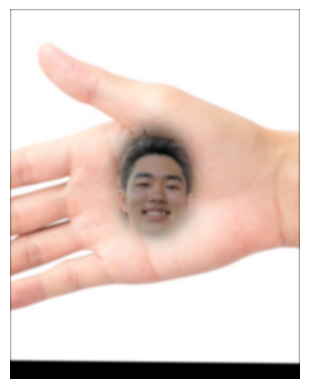

In [127]:
c_blended = multires_blend_custom(chris_laplacian_stack, hand_laplacian_stack, chris_head_mask_stack, sigma=3.0)
visualize_color(c_blended)